In [1]:
import ROOT
import glob
import math
import numpy as np
from IPython.display import display, Markdown
from IPython.display import display, HTML
from TPCQCVis.src.drawHistograms import *
from TPCQCVis.src.drawTrending import *
from TPCQCVis.src.checkHistograms import *

Welcome to JupyROOT 6.26/04


In [2]:
display(HTML("<style>.container { width:90% !important; }</style>"))
display(HTML("<style>table {float:left;}</style>"))

In [3]:
# Read the Root Files
path = "/home/berki/alice/data/asyncQC/LHC22c/apass1/"
fileList = glob.glob(path+"*_QC.root")
fileList.sort()
runList = [fileList[i][55:-8] for i in range(len(fileList))]
rootDataFile=[]
for file in fileList:
    rootDataFile.append(ROOT.TFile.Open(file,"READ"))
#rootDataFile[0].ls()
#rootDataFile[0].ClusterQC.ls()
#rootDataFile[0].PIDQC.ls()
#rootDataFile[0].TracksQC.ls()
#runList

# Reporting on TPC QC for LHC22c

| period | run number | Beam | Energy  | B field    | comment | reco   | Day (Start) | Start (CEST) | Day (End)  | End (CEST) | Duration | Filling scheme           | Colliding bcs | TPC Quality | TPC Comment | TPC gain calib ready |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |
|--------|------------|------|---------|------------|---------|--------|-------------|--------------|------------|------------|----------|--------------------------|---------------|-------------|-------------|----------------------|---|---|---|---|---|---|---|---|---|---|---|---|---|---|---|---|---|---|---|---|---|---|---|---|---|---|---|---|---|---|---|---|
| LHC22c | 517619     | pp   | 900 GeV | -30kA/-6kA |         | apass1 | 03.06.2022  | 10:34:01     | 03.06.2022 | 10:54:53   | 00:20:52 | Single_4b_2_2_2_noLR     | 2             |             |             | yes                  |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |
| LHC22c | 517620     | pp   | 900 GeV | -30kA/-6kA |         | apass1 | 03.06.2022  | 11:00:05     | 03.06.2022 | 12:27:43   | 01:27:38 | Single_4b_2_2_2_noLR     | 2             |             |             | yes                  |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |
| LHC22c | 517623     | pp   | 900 GeV | -30kA/-6kA |         | apass1 | 03.06.2022  | 12:49:43     | 03.06.2022 | 15:39:09   | 02:49:26 | Single_4b_2_2_2_noLR     | 2             |             |             | yes                  |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |
| LHC22c | 517677     | pp   | 900 GeV | -30kA/-6kA |         | apass1 | 04.06.2022  | 03:14:42     | 04.06.2022 | 03:48:15   | 00:33:33 | Single_3b_0_2_3          | 2             |             |             | yes                  |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |
| LHC22c | 517678     | pp   | 900 GeV | -30kA/-6kA |         | apass1 | 04.06.2022  | 03:53:38     | 04.06.2022 | 04:32:17   | 00:38:39 | Single_3b_0_2_4          | 2             |             |             | yes                  |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |
| LHC22c | 517679     | pp   | 900 GeV | -30kA/-6kA |         | apass1 | 04.06.2022  | 04:41:21     | 04.06.2022 | 04:57:46   | 00:16:25 | Single_3b_0_2_2          | 2             |             |             | yes                  |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |
| LHC22c | 517684     | pp   | 900 GeV | -30kA/-6kA |         | apass1 | 04.06.2022  | 05:47:08     | 04.06.2022 | 05:53:24   | 00:06:16 | Single_3b_3_1_1          | 1             |             |             | yes                  |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |
| LHC22c | 517685     | pp   | 900 GeV | -30kA/-6kA |         | apass1 | 04.06.2022  | 06:00:56     | 04.06.2022 | 07:45:21   | 01:44:25 | Single_3b_3_1_1          | 1             |             |             | yes                  |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |
| LHC22c | 517689     | pp   | 900 GeV | -30kA/-6kA |         | apass1 | 04.06.2022  | 08:38:52     | 04.06.2022 | 08:47:21   | 00:08:29 | Single_3b_3_1_1 (*)      | 1             |             |             | yes                  |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |
| LHC22c | 517690     | pp   | 900 GeV | -30kA/-6kA |         | apass1 | 04.06.2022  | 08:53:14     | 04.06.2022 | 10:29:59   | 01:36:45 | Single_3b_3_1_1 (*)      | 1             |             |             | yes                  |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |
| LHC22c | 517692     | pp   | 900 GeV | -30kA/-6kA |         | apass1 | 04.06.2022  | 10:50:09     | 04.06.2022 | 10:55:36   | 00:05:27 | Single_3b_3_1_1 (*)      | 1             |             |             | yes                  |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |
| LHC22c | 517693     | pp   | 900 GeV | -30kA/-6kA |         | apass1 | 04.06.2022  | 11:01:44     | 04.06.2022 | 11:09:45   | 00:08:01 | Single_3b_3_1_1 (*)      | 1             |             |             | yes                  |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |
| LHC22c | 517737     | pp   | 900 GeV | -30kA/-6kA |         | apass1 | 05.06.2022  | 08:34:45     | 05.06.2022 | 09:45:52   | 01:11:07 | Single_4b_2_2_2_noLR     | 2             |             |             | yes                  |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |
| LHC22c | 517748     | pp   | 900 GeV | -30kA/-6kA |         | apass1 | 05.06.2022  | 09:54:11     | 05.06.2022 | 10:56:26   | 01:02:15 | Single_4b_2_2_2_noLR     | 2             |             |             | yes                  |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |
| LHC22c | 517750     | pp   | 900 GeV | -30kA/-6kA | no FT0  | apass1 | 05.06.2022  | 11:13:54     | 05.06.2022 | 11:29:21   | 00:15:27 | Single_4b_2_2_2_noLR     | 2             |             |             | yes                  |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |
| LHC22c | 517751     | pp   | 900 GeV | -30kA/-6kA |         | apass1 | 05.06.2022  | 11:34:42     | 05.06.2022 | 12:54:32   | 01:19:50 | Single_4b_2_2_2_noLR     | 2             |             |             | yes                  |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |
| LHC22c | 517753     | pp   | 900 GeV | -30kA/-6kA |         | apass1 | 05.06.2022  | 13:01:34     | 05.06.2022 | 14:08:01   | 01:06:27 | Single_4b_2_2_2_noLR     | 2             |             |             | yes                  |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |
| LHC22c | 517758     | pp   | 900 GeV | -30kA/-6kA |         | apass1 | 05.06.2022  | 14:43:04     | 05.06.2022 | 14:57:33   | 00:14:29 | Single_4b_2_2_2_noLR     | 2             |             |             | yes                  |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |   |
| LHC22c | 517767     | pp   | 900 GeV | -30kA/-6kA |         | apass1 | 05.06.2022  | 17:07:25     | 05.06.2022 | 18:37:11   | 01:29:46 | Single_4b_2_2_2_noLR (*) | 2             |             |             | yes                  |


---

---
## General comments:
+ Runs `517751` & `517753` have higher Pt tails and stronger secondary peak in #clusters distribution

---
# Observations:

## Number of tracks per run
+ All `OK`

In [4]:
%jsroot on
objectName="hPt;1"
[trend,canvas] = drawTrending(objectName,rootDataFile,names=runList,trend="entries",error="",log="logy",namesFromRunList=True)
canvas.Draw()

---
## Cluster QC

+ No faulty regions or hotspots detected
+ All `ÒK`

In [5]:
%jsroot on
objectName = "c_N_Clusters"
c = rootDataFile[0].ClusterQC.Get(objectName)
c.Draw()

In [6]:
%jsroot on
objectName = "c_Q_Tot"
c = rootDataFile[0].ClusterQC.Get(objectName)
c.Draw()

In [7]:
%jsroot on
objectName = "c_Sigma_Time"
c = rootDataFile[0].ClusterQC.Get(objectName)
c.Draw()

---
## Tracks QC
**Notes:** Runs `OK`

## Phi distribution of tracks:

+ All runs in agreement
+ All `OK`

In [8]:
%jsroot on
objectName="hPhiAside"
[hist,legend,canvas,pad1] = drawHistograms(objectName,rootDataFile,normalize=True,legend=True,legendNames=runList,pads=False, drawOption="SAME L")

#Sector boundatries
pad1.cd()
sectorBoundary = ROOT.TLine(0,hist.GetMinimum(),0,hist.GetMaximum())
sectorBoundary.SetLineStyle(2)
sectorNum = ROOT.TText(.5,.5,"test")
sectorNum.SetTextAlign(22)
sectorNum.SetTextColor(ROOT.kGray+1)
sectorNum.SetTextFont(0)
for j in range(19):
    sectorBoundary.DrawLine((j*2*math.pi)/18,hist.GetMinimum(),(j*2*math.pi)/18,hist.GetMaximum())
    if j < 18 : sectorNum.DrawText(((j+0.5)*2*math.pi)/18,hist.GetMaximum(),str(j))
    
canvas.Draw()

+ C-side no major issues observed

In [9]:
%jsroot on
objectName="hPhiCside"
[hist,legend,canvas,pad1] = drawHistograms(objectName,rootDataFile,normalize=True,legend=True,legendNames=runList,pads=False, drawOption="SAME L")
#Sector boundatries
pad1.cd()
sectorBoundary = ROOT.TLine(0,hist.GetMinimum(),0,hist.GetMaximum())
sectorBoundary.SetLineStyle(2)
sectorNum = ROOT.TText(.5,.5,"test")
sectorNum.SetTextAlign(22)
sectorNum.SetTextColor(ROOT.kGray+1)
sectorNum.SetTextFont(0)
for j in range(19):
    sectorBoundary.DrawLine((j*2*math.pi)/18,hist.GetMinimum(),(j*2*math.pi)/18,hist.GetMaximum())
    if j < 18 : sectorNum.DrawText(((j+0.5)*2*math.pi)/18,hist.GetMaximum(),str(j))
        
canvas.Draw()

### Number of clusters vs phi
+ No problems observed
+ All `OK`

In [10]:
%jsroot on
objectName="h2DNClustersPhiAside"
[hist,legend,canvas,pad1] = drawHistograms(objectName,rootDataFile,normalize=False,legend=False,legendNames=runList,pads=True,drawOption="COLZ")
canvas.Draw()

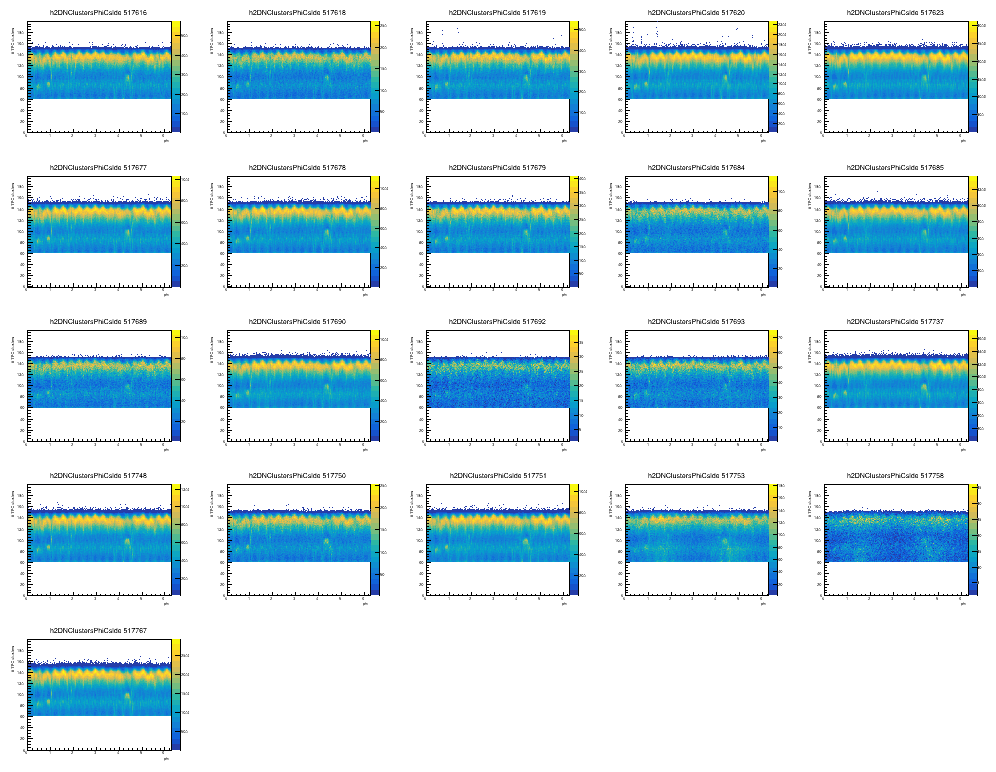

In [11]:
%jsroot off
objectName="h2DNClustersPhiCside"
[hist,legend,canvas,pad1] = drawHistograms(objectName,rootDataFile,normalize=False,legend=False,legendNames=runList,pads=True,drawOption="COLZ")
canvas.Draw()

---
### Pt distribution
+ Runs `517751` & `517753` have higher Pt tails

In [12]:
%jsroot on
objectName="hPt"
[hist,legend,canvas,pad1] = drawHistograms(objectName,rootDataFile[-15:],normalize=True,legend=True,log="logxy",legendNames=runList[-15:],pads=False)
canvas.Draw()

---
### Clusters per track

+ Runs `517751` & `517753` have more prominent second peak

In [13]:
%jsroot on
objectName="hNClustersAfterCuts"
[hist,legend,canvas,pad1] = drawHistograms(objectName,rootDataFile[-5:],normalize=True,legend=True,legendNames=runList[-5:],pads=False)
canvas.Draw()

### Eta
+ All `OK`

In [14]:
%jsroot on
objectName="hEta"
[hist,legend,canvas,pad1] = drawHistograms(objectName,rootDataFile,normalize=True,legend=False,legendNames=runList,pads=False)
canvas.Draw()

In [15]:
%jsroot on
objectName="h2DNClustersEta"
[hist,legend,canvas,pad1] = drawHistograms(objectName,rootDataFile,normalize=False,legend=False,legendNames=runList,pads=True,drawOption="COLZ")
canvas.Draw()

---
### Sign of tracks

+ Ratio of pos/neg tracks consistent in all runs
  + Result: `GOOD`
+ Run `517758` has slightly different ratio. Explained by lower statistics dominated by cosmics

In [16]:
%jsroot on
objectName="hSign"
[hist,legend,canvas,pad1] = drawHistograms(objectName,rootDataFile[-8:],normalize=True,legend=True,legendNames=runList[-8:],pads=False)
canvas.Draw()

---
## PID QC

### MIP signal
+ All `OK`

In [17]:
%jsroot on
objectName="hdEdxTotMIP_TPC"
quality = checkHistograms(objectName,rootDataFile,check="(histogram.Fit(\"gaus\",\"Sq\",\"\",40,60)) and 45<histogram.GetFunction(\"gaus\").GetParameter(1)<55")
[hist,legend,canvas,pad1] = drawHistograms(objectName,rootDataFile,legendNames=runList,check=quality,normalize=False,log="logx",legend=False,pads=True)
canvas.Draw()

---
### dEdx vs P
+ All `OK`

In [18]:
%jsroot on
objectName="hdEdxTotVsP_TPC"
[hist,legend,canvas,pad1] = drawHistograms(objectName,rootDataFile,legendNames=runList,log="logxyz",pads=True,drawOption="COLZ")
canvas.Draw()